In [1]:
import pandas as pd 
import numpy as np 


In [2]:
DAX = pd.read_html('https://en.wikipedia.org/wiki/DAX')[3]
DAX.drop(columns=['Index weighting (%)1', 'Founded','Employees','Unnamed: 0'],inplace = True)
DAX

,Company,Prime Standard Sector,Ticker symbol
0,Adidas,Textile,ADS.DE
1,Airbus,Aerospace,AIR.DE
2,Allianz,Financial Services,ALV.DE
3,BASF,Basic Materials,BAS.DE
4,Bayer,Healthcare,BAYN.DE
5,Beiersdorf,Consumer goods,BEI.DE
6,BMW,Automobile,BMW.DE
7,Brenntag,Distribution,BNR.DE
8,Continental,Automotive,CON.DE
9,Covestro,Basic Materials,1COV.DE


In [10]:
ticker = DAX['Ticker symbol'].to_list()
ticker

['ADS.DE',
 'AIR.DE',
 'ALV.DE',
 'BAS.DE',
 'BAYN.DE',
 'BEI.DE',
 'BMW.DE',
 'BNR.DE',
 'CON.DE',
 '1COV.DE',
 'DTG.DE',
 'DBK.DE',
 'DB1.DE',
 'DPW.DE',
 'DTE.DE',
 'EOAN.DE',
 'FRE.DE',
 'FME.DE',
 'HNR1.DE',
 'HEI.DE',
 'HFG.DE',
 'HEN3.DE',
 'IFX.DE',
 'LIN.DE',
 'MBG.DE',
 'MRK.DE',
 'MTX.DE',
 'MUV2.DE',
 'PAH3.DE',
 'PUM.DE',
 'QIA.DE',
 'RWE.DE',
 'SAP.DE',
 'SRT3.DE',
 'SIE.DE',
 'SHL.DE',
 'SY1.DE',
 'VOW3.DE',
 'VNA.DE',
 'ZAL.DE']

In [11]:
from pandas_datareader import DataReader, get_quote_yahoo


In [12]:
market_cap = get_quote_yahoo(ticker)['marketCap']
market_cap

ADS.DE      31538976768
AIR.DE      80168484864
ALV.DE      70417776640
BAS.DE      38971064320
BAYN.DE     55654322176
BEI.DE      22704582656
BMW.DE      51275857920
BNR.DE      10271160320
CON.DE      13432403968
1COV.DE      6360638976
DTG.DE      21691697152
DBK.DE      17222395904
DB1.DE      31004745728
DPW.DE      45733781504
DTE.DE      91036213248
EOAN.DE     22155626496
FRE.DE      13814721536
FME.DE      10965069824
HNR1.DE     16383102976
HEI.DE       9258761216
HFG.DE       4519934464
HEN3.DE     26525206528
IFX.DE      33081026560
LIN.DE     145676632064
MBG.DE      60873895936
MRK.DE      80151322624
MTX.DE       9971158016
MUV2.DE     30457524224
PAH3.DE     21339498496
PUM.DE       9897755648
QIA.DE      10955951104
RWE.DE      26913556480
SAP.DE     103989141504
SRT3.DE     27545804800
SIE.DE      84584259584
SHL.DE      54819975168
SY1.DE      15549634560
VOW3.DE     94385373184
VNA.DE      25421008896
ZAL.DE       6703656960
Name: marketCap, dtype: int64

In [13]:
DAX['Market capitalization'] = market_cap.values
DAX['Market capitalization'] = DAX['Market capitalization'] / 1000000000
DAX

,Company,Prime Standard Sector,Ticker symbol,Market capitalization
0,Adidas,Textile,ADS.DE,31.538977
1,Airbus,Aerospace,AIR.DE,80.168485
2,Allianz,Financial Services,ALV.DE,70.417777
3,BASF,Basic Materials,BAS.DE,38.971064
4,Bayer,Healthcare,BAYN.DE,55.654322
5,Beiersdorf,Consumer goods,BEI.DE,22.704583
6,BMW,Automobile,BMW.DE,51.275858
7,Brenntag,Distribution,BNR.DE,10.271160
8,Continental,Automotive,CON.DE,13.432404
9,Covestro,Basic Materials,1COV.DE,6.360639


In [14]:
DAX.set_index('Ticker symbol' , inplace = True)
DAX.head()

,Company,Prime Standard Sector,Market capitalization
Ticker symbol,,,
ADS.DE,Adidas,Textile,31.538977
AIR.DE,Airbus,Aerospace,80.168485
ALV.DE,Allianz,Financial Services,70.417777
BAS.DE,BASF,Basic Materials,38.971064
BAYN.DE,Bayer,Healthcare,55.654322


In [15]:
composantes = DAX.groupby('Prime Standard Sector')['Market capitalization'].nlargest(1)
composantes

Prime Standard Sector   Ticker symbol
Aerospace               AIR.DE            80.168485
Automobile              VOW3.DE           94.385373
Automotive              CON.DE            13.432404
Basic Materials         LIN.DE           145.676632
Chemicals               SRT3.DE           27.545805
Communication Services  DTE.DE            91.036213
Consumer Goods          HEN3.DE           26.525207
Consumer goods          BEI.DE            22.704583
Distribution            BNR.DE            10.271160
E-Commerce              ZAL.DE             6.703657
Financial Services      ALV.DE            70.417777
Healthcare              MRK.DE            80.151323
Industrials             SIE.DE            84.584260
Insurance               HNR1.DE           16.383103
Online Food Ordering    HFG.DE             4.519934
Real Estate             VNA.DE            25.421009
Technology              SAP.DE           103.989142
Textile                 ADS.DE            31.538977
Utilities               RW

In [16]:
composantes=composantes.reset_index()
composantes

,Prime Standard Sector,Ticker symbol,Market capitalization
0,Aerospace,AIR.DE,80.168485
1,Automobile,VOW3.DE,94.385373
2,Automotive,CON.DE,13.432404
3,Basic Materials,LIN.DE,145.676632
4,Chemicals,SRT3.DE,27.545805
5,Communication Services,DTE.DE,91.036213
6,Consumer Goods,HEN3.DE,26.525207
7,Consumer goods,BEI.DE,22.704583
8,Distribution,BNR.DE,10.271160
9,E-Commerce,ZAL.DE,6.703657


In [17]:
composantes.sort_values(by = 'Market capitalization', ascending = False)

,Prime Standard Sector,Ticker symbol,Market capitalization
3,Basic Materials,LIN.DE,145.676632
16,Technology,SAP.DE,103.989142
1,Automobile,VOW3.DE,94.385373
5,Communication Services,DTE.DE,91.036213
12,Industrials,SIE.DE,84.584260
0,Aerospace,AIR.DE,80.168485
11,Healthcare,MRK.DE,80.151323
10,Financial Services,ALV.DE,70.417777
17,Textile,ADS.DE,31.538977
4,Chemicals,SRT3.DE,27.545805


In [18]:
symbols = composantes['Ticker symbol'].to_list()
symbols

['AIR.DE',
 'VOW3.DE',
 'CON.DE',
 'LIN.DE',
 'SRT3.DE',
 'DTE.DE',
 'HEN3.DE',
 'BEI.DE',
 'BNR.DE',
 'ZAL.DE',
 'ALV.DE',
 'MRK.DE',
 'SIE.DE',
 'HNR1.DE',
 'HFG.DE',
 'VNA.DE',
 'SAP.DE',
 'ADS.DE',
 'RWE.DE']

In [19]:
stocks_prices = DataReader(symbols, 'yahoo', start='2017-01-01')['Adj Close']
stocks_prices

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
Date,,,,,,,,,,,,,,,,,,,
2017-01-02,57.104538,114.731522,150.687119,65.594437,69.398582,11.846730,99.246483,78.225182,46.460648,36.904999,118.088882,93.046143,97.701485,95.195312,NaN,25.683496,76.155090,136.749084,9.788148
2017-01-03,57.749527,116.980347,152.298752,65.594437,70.380959,11.803455,97.734901,77.499016,46.583031,37.314999,119.778008,93.229927,96.251923,96.113297,NaN,25.232908,75.562546,134.896271,9.707154
2017-01-04,57.622345,115.564423,150.808014,65.594437,69.641747,11.944101,97.821274,76.897064,46.128475,35.919998,120.416130,93.229927,95.837746,96.939499,NaN,25.232908,75.143204,132.320358,9.601862
2017-01-05,58.667053,115.855927,150.082764,65.594437,69.301323,11.980165,98.080406,77.202820,45.962387,36.764999,120.641350,94.654343,95.216499,94.139618,NaN,25.728558,75.380241,130.422318,9.707154
2017-01-06,59.203026,115.772636,151.734695,65.594437,70.030807,11.936888,97.691696,76.954391,45.429161,37.349998,120.941635,93.873215,96.044830,94.231422,NaN,25.601570,76.264481,130.874222,9.557315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-22,105.580002,134.320007,70.540001,280.850006,418.500000,18.164000,61.279999,99.919998,66.199997,29.760000,174.119995,178.050003,105.419998,138.300003,26.670000,31.920000,92.059998,176.619995,37.520000
2022-07-25,105.660004,132.639999,70.879997,280.149994,399.299988,18.181999,61.279999,99.739998,65.660004,28.820000,174.419998,180.350006,104.400002,137.550003,26.790001,30.840000,90.010002,176.020004,37.840000
2022-07-26,104.940002,130.419998,69.080002,282.149994,399.600006,18.129999,61.900002,100.800003,65.080002,25.990000,173.639999,179.899994,102.839996,137.649994,24.840000,30.040001,89.220001,169.720001,38.150002


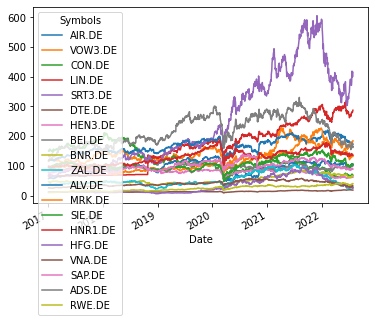

In [20]:
import matplotlib.pyplot as plt

stocks_prices.plot()

plt.show()

In [21]:
import plotly.express as px

In [22]:
def plotly_plot (data, title): 
    fig = px.line(title = title)
    for i in data.columns:
        fig.add_scatter(x = data.index, y = data[i], name = i)
    fig.show()

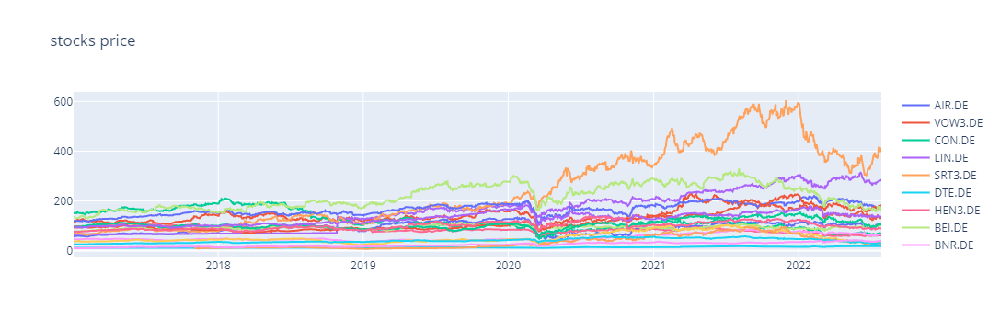

In [23]:
plotly_plot((stocks_prices), 'stocks price')

In [24]:
max_acum = stocks_prices.cummax()
max_acum

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
Date,,,,,,,,,,,,,,,,,,,
2017-01-02,57.104538,114.731522,150.687119,65.594437,69.398582,11.846730,99.246483,78.225182,46.460648,36.904999,118.088882,93.046143,97.701485,95.195312,NaN,25.683496,76.155090,136.749084,9.788148
2017-01-03,57.749527,116.980347,152.298752,65.594437,70.380959,11.846730,99.246483,78.225182,46.583031,37.314999,119.778008,93.229927,97.701485,96.113297,NaN,25.683496,76.155090,136.749084,9.788148
2017-01-04,57.749527,116.980347,152.298752,65.594437,70.380959,11.944101,99.246483,78.225182,46.583031,37.314999,120.416130,93.229927,97.701485,96.939499,NaN,25.683496,76.155090,136.749084,9.788148
2017-01-05,58.667053,116.980347,152.298752,65.594437,70.380959,11.980165,99.246483,78.225182,46.583031,37.314999,120.641350,94.654343,97.701485,96.939499,NaN,25.728558,76.155090,136.749084,9.788148
2017-01-06,59.203026,116.980347,152.298752,65.594437,70.380959,11.980165,99.246483,78.225182,46.583031,37.349998,120.941635,94.654343,97.701485,96.939499,NaN,25.728558,76.264481,136.749084,9.788148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-22,132.732422,228.379395,211.162598,313.500000,605.044434,19.266001,112.826996,113.749046,85.019302,104.650002,220.219437,227.056595,153.592850,183.296066,96.18,58.135124,139.157257,330.101807,43.320000
2022-07-25,132.732422,228.379395,211.162598,313.500000,605.044434,19.266001,112.826996,113.749046,85.019302,104.650002,220.219437,227.056595,153.592850,183.296066,96.18,58.135124,139.157257,330.101807,43.320000
2022-07-26,132.732422,228.379395,211.162598,313.500000,605.044434,19.266001,112.826996,113.749046,85.019302,104.650002,220.219437,227.056595,153.592850,183.296066,96.18,58.135124,139.157257,330.101807,43.320000


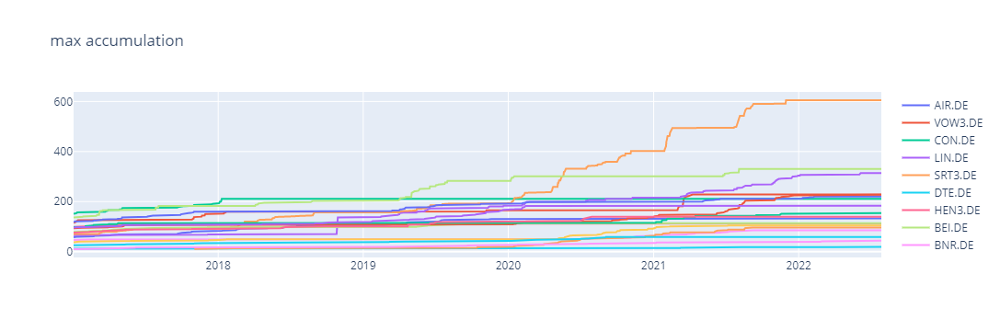

In [25]:
plotly_plot((max_acum), 'max accumulation')

In [26]:
drawdown_1 = (stocks_prices - max_acum)/max_acum
drawdown_1

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
Date,,,,,,,,,,,,,,,,,,,
2017-01-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000
2017-01-03,0.000000,0.000000,0.000000,0.000000,0.000000,-0.003653,-0.015231,-0.009283,0.000000,0.000000,0.000000,0.000000,-0.014837,0.000000,NaN,-0.017544,-0.007781,-0.013549,-0.008275
2017-01-04,-0.002202,-0.012104,-0.009788,0.000000,-0.010503,0.000000,-0.014360,-0.016978,-0.009758,-0.037384,0.000000,0.000000,-0.019076,0.000000,NaN,-0.017544,-0.013287,-0.032386,-0.019032
2017-01-05,0.000000,-0.009612,-0.014550,0.000000,-0.015340,0.000000,-0.011749,-0.013069,-0.013323,-0.014739,0.000000,0.000000,-0.025434,-0.028883,NaN,0.000000,-0.010175,-0.046266,-0.008275
2017-01-06,0.000000,-0.010324,-0.003704,0.000000,-0.004975,-0.003612,-0.015666,-0.016245,-0.024770,0.000000,0.000000,-0.008252,-0.016956,-0.027936,NaN,-0.004936,0.000000,-0.042961,-0.023583
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-22,-0.204565,-0.411856,-0.665945,-0.104147,-0.308315,-0.057199,-0.456868,-0.121575,-0.221353,-0.715624,-0.209334,-0.215834,-0.313640,-0.245483,-0.722707,-0.450934,-0.338446,-0.464953,-0.133887
2022-07-25,-0.203962,-0.419212,-0.664335,-0.106380,-0.340048,-0.056265,-0.456868,-0.123158,-0.227705,-0.724606,-0.207972,-0.205705,-0.320281,-0.249575,-0.721460,-0.469512,-0.353178,-0.466771,-0.126500
2022-07-26,-0.209387,-0.428933,-0.672859,-0.100000,-0.339553,-0.058964,-0.451372,-0.113839,-0.234527,-0.751648,-0.211514,-0.207687,-0.330438,-0.249029,-0.741734,-0.483273,-0.358855,-0.485856,-0.119344


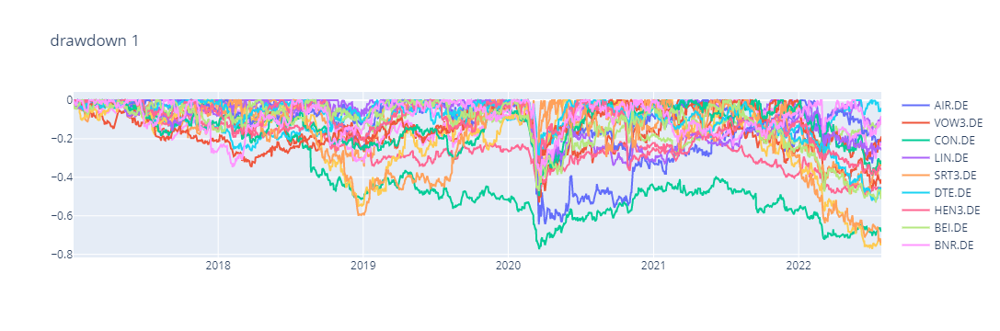

In [27]:
plotly_plot((drawdown_1), 'drawdown 1')

In [28]:
drawdown_1.min()

Symbols
AIR.DE    -0.644707
VOW3.DE   -0.529970
CON.DE    -0.773141
LIN.DE    -0.329098
SRT3.DE   -0.500202
DTE.DE    -0.348490
HEN3.DE   -0.490016
BEI.DE    -0.296326
BNR.DE    -0.439011
ZAL.DE    -0.772575
ALV.DE    -0.487069
MRK.DE    -0.353025
SIE.DE    -0.492605
HNR1.DE   -0.441268
HFG.DE    -0.741734
VNA.DE    -0.523696
SAP.DE    -0.389611
ADS.DE    -0.532144
RWE.DE    -0.390244
dtype: float64

In [29]:
def Normalize(data):
    
    x = data.copy()
    for i in x.columns:
        x[i] = x[i]/x[i][0]
    return x

In [30]:
Normalize(stocks_prices)

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
Date,,,,,,,,,,,,,,,,,,,
2017-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,1.000000,1.000000,1.000000,1.000000
2017-01-03,1.011295,1.019601,1.010695,1.000000,1.014156,0.996347,0.984769,0.990717,1.002634,1.011110,1.014304,1.001975,0.985163,1.009643,NaN,0.982456,0.992219,0.986451,0.991725
2017-01-04,1.009068,1.007260,1.000802,1.000000,1.003504,1.008219,0.985640,0.983022,0.992850,0.973310,1.019708,1.001975,0.980924,1.018322,NaN,0.982456,0.986713,0.967614,0.980968
2017-01-05,1.027362,1.009800,0.995989,1.000000,0.998599,1.011263,0.988251,0.986931,0.989276,0.996206,1.021615,1.017284,0.974566,0.988910,NaN,1.001754,0.989825,0.953734,0.991725
2017-01-06,1.036748,1.009074,1.006952,1.000000,1.009110,1.007610,0.984334,0.983755,0.977799,1.012058,1.024158,1.008889,0.983044,0.989875,NaN,0.996810,1.001436,0.957039,0.976417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-22,1.848890,1.170733,0.468122,4.281613,6.030383,1.533250,0.617453,1.277338,1.424862,0.806395,1.474483,1.913567,1.079001,1.452803,NaN,1.242821,1.208849,1.291563,3.833207
2022-07-25,1.850291,1.156090,0.470379,4.270941,5.753720,1.534769,0.617453,1.275037,1.413239,0.780924,1.477023,1.938286,1.068561,1.444924,NaN,1.200771,1.181930,1.287175,3.865900
2022-07-26,1.837682,1.136741,0.458433,4.301432,5.758043,1.530380,0.623700,1.288588,1.400755,0.704241,1.470418,1.933449,1.052594,1.445974,NaN,1.169623,1.171557,1.241105,3.897571


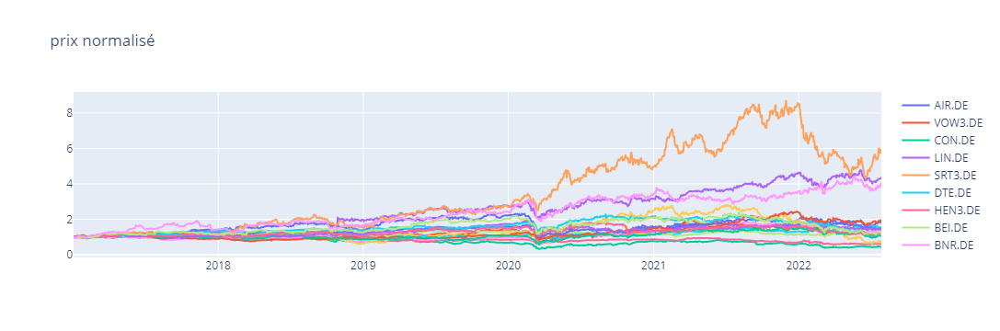

In [31]:
plotly_plot(Normalize(stocks_prices), 'prix normalisé')

In [32]:
for col in stocks_prices.columns:
    rendement = (stocks_prices[col][-1]-stocks_prices[col][0])/stocks_prices[col][0]
    print(col, rendement, '%')

AIR.DE 0.7819950176397358 %
VOW3.DE 0.17421959836654788 %
CON.DE -0.5548391761331734 %
LIN.DE 3.37384645053023 %
SRT3.DE 4.971303436123018 %
DTE.DE 0.5457429953815738 %
HEN3.DE -0.3795245930813353 %
BEI.DE 0.2789999464553803 %
BNR.DE 0.43088843602876337 %
ZAL.DE -0.3003657892190791 %
ALV.DE 0.46042542821343074 %
MRK.DE 0.9828871448925133 %
SIE.DE 0.08002449490388397 %
HNR1.DE 0.426015592942142 %
HFG.DE nan %
VNA.DE 0.24048533037902872 %
SAP.DE 0.16761726341942335 %
ADS.DE 0.2004468205045577 %
RWE.DE 3.0661419848382887 %


In [37]:
n_days = 252

In [33]:
returns = stocks_prices.pct_change()
returns

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
Date,,,,,,,,,,,,,,,,,,,
2017-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-03,0.011295,0.019601,0.010695,0.000000,0.014156,-0.003653,-0.015231,-0.009283,0.002634,0.011110,0.014304,0.001975,-0.014837,0.009643,NaN,-0.017544,-0.007781,-0.013549,-0.008275
2017-01-04,-0.002202,-0.012104,-0.009788,0.000000,-0.010503,0.011916,0.000884,-0.007767,-0.009758,-0.037384,0.005328,0.000000,-0.004303,0.008596,NaN,0.000000,-0.005550,-0.019096,-0.010847
2017-01-05,0.018130,0.002522,-0.004809,0.000000,-0.004888,0.003019,0.002649,0.003976,-0.003601,0.023525,0.001870,0.015279,-0.006482,-0.028883,NaN,0.019643,0.003154,-0.014344,0.010966
2017-01-06,0.009136,-0.000719,0.011007,0.000000,0.010526,-0.003612,-0.003963,-0.003218,-0.011601,0.015912,0.002489,-0.008252,0.008699,0.000975,NaN,-0.004936,0.011730,0.003465,-0.015436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-22,0.008020,-0.011481,-0.017001,0.000534,0.013317,-0.030426,-0.005195,0.005434,0.002423,0.042382,-0.001491,-0.014120,-0.016054,0.014301,0.036131,0.065065,0.044475,0.008796,0.007248
2022-07-25,0.000758,-0.012508,0.004820,-0.002492,-0.045878,0.000991,0.000000,-0.001801,-0.008157,-0.031586,0.001723,0.012918,-0.009676,-0.005423,0.004499,-0.033835,-0.022268,-0.003397,0.008529
2022-07-26,-0.006814,-0.016737,-0.025395,0.007139,0.000751,-0.002860,0.010118,0.010628,-0.008833,-0.098196,-0.004472,-0.002495,-0.014943,0.000727,-0.072788,-0.025940,-0.008777,-0.035791,0.008192


In [34]:
returns = returns.dropna()
returns

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
Date,,,,,,,,,,,,,,,,,,,
2017-11-03,0.009614,-0.003059,0.000450,0.000000,0.009379,0.012298,0.007353,0.008552,0.015143,0.012853,-0.005150,-0.002585,-0.002410,0.000470,-0.032563,0.006235,0.000607,-0.000801,0.006104
2017-11-06,-0.004589,-0.004910,-0.003825,0.000000,-0.008920,-0.026215,-0.008921,-0.002861,-0.014917,-0.007203,-0.004930,0.011878,-0.002415,0.004695,-0.014634,0.002066,0.007081,-0.021390,0.015506
2017-11-07,-0.003688,-0.001542,-0.009033,0.000000,-0.003125,-0.005581,-0.010638,-0.006250,-0.007770,-0.056656,-0.001486,-0.010671,-0.005246,0.010280,-0.049505,0.006184,-0.010648,0.002186,0.013277
2017-11-08,-0.012147,-0.022236,-0.012762,0.000000,-0.004389,-0.006603,0.009926,0.014228,0.042771,0.001099,0.001737,-0.003236,0.000406,0.000925,-0.055208,0.002945,0.000102,0.003817,0.010701
2017-11-09,-0.015458,-0.006317,-0.003232,0.000000,-0.020529,0.002326,-0.009419,-0.005591,0.001155,0.002683,-0.007925,-0.009739,-0.037307,0.016174,0.016538,-0.001277,-0.017462,-0.046714,-0.003890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-22,0.008020,-0.011481,-0.017001,0.000534,0.013317,-0.030426,-0.005195,0.005434,0.002423,0.042382,-0.001491,-0.014120,-0.016054,0.014301,0.036131,0.065065,0.044475,0.008796,0.007248
2022-07-25,0.000758,-0.012508,0.004820,-0.002492,-0.045878,0.000991,0.000000,-0.001801,-0.008157,-0.031586,0.001723,0.012918,-0.009676,-0.005423,0.004499,-0.033835,-0.022268,-0.003397,0.008529
2022-07-26,-0.006814,-0.016737,-0.025395,0.007139,0.000751,-0.002860,0.010118,0.010628,-0.008833,-0.098196,-0.004472,-0.002495,-0.014943,0.000727,-0.072788,-0.025940,-0.008777,-0.035791,0.008192


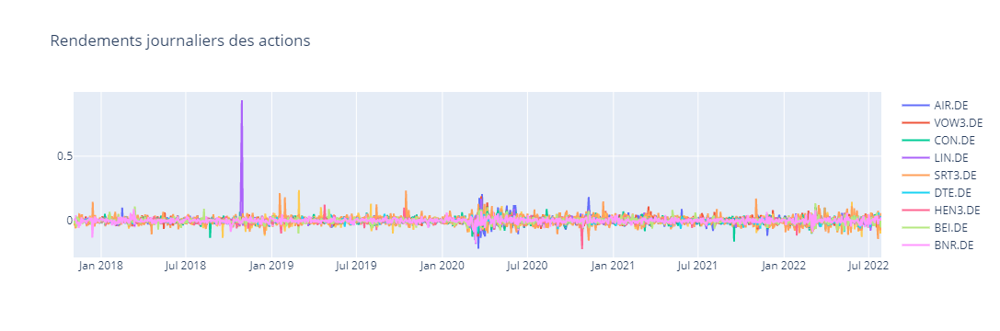

In [35]:
plotly_plot(returns, ' Rendements journaliers des actions')

In [36]:
returns.corr()

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
Symbols,,,,,,,,,,,,,,,,,,,
AIR.DE,1.000000,0.550682,0.516215,0.233093,0.153841,0.481472,0.395785,0.248649,0.463486,0.256946,0.645134,0.335683,0.574885,0.506397,0.018182,0.298755,0.440469,0.503576,0.309988
VOW3.DE,0.550682,1.000000,0.705481,0.311104,0.140530,0.519974,0.439320,0.292888,0.532719,0.331668,0.674788,0.366636,0.664356,0.575528,0.102209,0.293417,0.475837,0.487440,0.347323
CON.DE,0.516215,0.705481,1.000000,0.284289,0.112443,0.425331,0.401873,0.250516,0.498479,0.317973,0.610162,0.275309,0.615847,0.520371,0.089463,0.173429,0.403662,0.456688,0.282830
LIN.DE,0.233093,0.311104,0.284289,1.000000,0.127232,0.262939,0.230460,0.193763,0.249417,0.144321,0.313420,0.252556,0.330609,0.281620,0.063846,0.148768,0.245811,0.241891,0.198439
SRT3.DE,0.153841,0.140530,0.112443,0.127232,1.000000,0.214200,0.185785,0.233013,0.331426,0.339190,0.168349,0.424373,0.296808,0.184681,0.321082,0.311250,0.348273,0.304310,0.256244
DTE.DE,0.481472,0.519974,0.425331,0.262939,0.214200,1.000000,0.484950,0.407036,0.470917,0.246815,0.619002,0.386025,0.574460,0.548447,0.132792,0.426010,0.433313,0.463541,0.429971
HEN3.DE,0.395785,0.439320,0.401873,0.230460,0.185785,0.484950,1.000000,0.487750,0.427270,0.203402,0.506806,0.310928,0.494624,0.493475,0.097419,0.294693,0.415607,0.398983,0.379486
BEI.DE,0.248649,0.292888,0.250516,0.193763,0.233013,0.407036,0.487750,1.000000,0.364639,0.216444,0.360073,0.323864,0.345373,0.402106,0.179197,0.323719,0.358310,0.343079,0.377151
BNR.DE,0.463486,0.532719,0.498479,0.249417,0.331426,0.470917,0.427270,0.364639,1.000000,0.378827,0.561548,0.441332,0.611271,0.512499,0.189042,0.333827,0.482383,0.449376,0.361288


In [41]:
import seaborn as sns 

In [47]:
def plot_heatmap(df): 
    
    cor_map =df.corr()
    plt.figure(figsize = (10,10))
    
    mask = np.triu(np.ones_like(cor_map, dtype= bool))
    sns.heatmap(cor_map, mask = mask, center = 0, cmap ='RdBu', linewidths=1, annot= True, fmt= '.2f', vmin=-1, vmax=1)
    plt.title('Carte des corrélations', fontsize =15, fontweight = 'bold')
    plt         

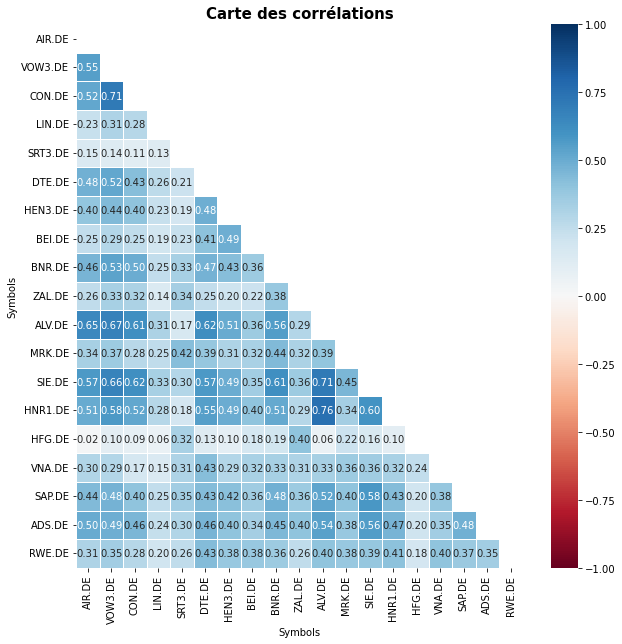

In [48]:
plot_heatmap(returns)

In [42]:
returns.mean()*100

Symbols
AIR.DE     0.057616
VOW3.DE    0.025289
CON.DE    -0.055523
LIN.DE     0.155234
SRT3.DE    0.169247
DTE.DE     0.044250
HEN3.DE   -0.035622
BEI.DE     0.014716
BNR.DE     0.047578
ZAL.DE    -0.003703
ALV.DE     0.020443
MRK.DE     0.076521
SIE.DE     0.016399
HNR1.DE    0.041648
HFG.DE     0.133507
VNA.DE     0.011382
SAP.DE     0.013480
ADS.DE     0.018816
RWE.DE     0.085467
dtype: float64

In [43]:
returns.mean()*n_days*100

Symbols
AIR.DE     14.519301
VOW3.DE     6.372771
CON.DE    -13.991793
LIN.DE     39.119038
SRT3.DE    42.650259
DTE.DE     11.151089
HEN3.DE    -8.976647
BEI.DE      3.708547
BNR.DE     11.989712
ZAL.DE     -0.933088
ALV.DE      5.151635
MRK.DE     19.283242
SIE.DE      4.132522
HNR1.DE    10.495310
HFG.DE     33.643659
VNA.DE      2.868173
SAP.DE      3.396970
ADS.DE      4.741576
RWE.DE     21.537696
dtype: float64

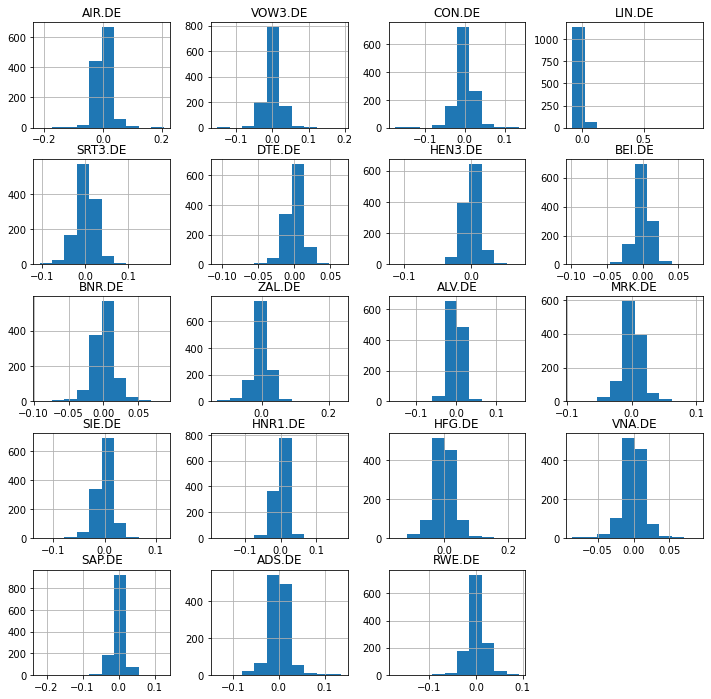

In [44]:
returns.hist(figsize=(12,12));

In [45]:
returns.describe()

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
count,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000,1198.000000
mean,0.000576,0.000253,-0.000555,0.001552,0.001692,0.000443,-0.000356,0.000147,0.000476,-0.000037,0.000204,0.000765,0.000164,0.000416,0.001335,0.000114,0.000135,0.000188,0.000855
std,0.027179,0.023343,0.024109,0.030917,0.024484,0.013002,0.014313,0.013282,0.016869,0.027305,0.016520,0.016160,0.018217,0.016942,0.034239,0.015759,0.017477,0.020727,0.019380
min,-0.215624,-0.152115,-0.174502,-0.078349,-0.106030,-0.106557,-0.113313,-0.098130,-0.091662,-0.131981,-0.153277,-0.092217,-0.126960,-0.177936,-0.152501,-0.084982,-0.219376,-0.134064,-0.172973
25%,-0.010903,-0.011492,-0.012290,-0.004712,-0.011230,-0.005642,-0.007414,-0.005873,-0.007994,-0.011870,-0.006505,-0.007369,-0.008830,-0.006320,-0.016883,-0.007446,-0.007962,-0.010149,-0.008875
50%,0.000000,-0.000360,-0.000471,0.000000,0.002667,0.000000,0.000215,0.000000,0.000379,0.000000,0.000414,0.000721,0.000390,0.000781,0.000000,0.000366,0.000344,0.000000,0.000810
75%,0.011081,0.010606,0.011415,0.007256,0.015160,0.007197,0.007682,0.006970,0.008655,0.013804,0.007188,0.010032,0.009211,0.008178,0.018390,0.008273,0.009236,0.010113,0.011096
max,0.206724,0.190461,0.135634,0.933254,0.181979,0.065177,0.070743,0.075579,0.086927,0.237586,0.158038,0.101168,0.115594,0.170710,0.233577,0.088012,0.125491,0.136314,0.091970


In [46]:
returns.std()

Symbols
AIR.DE     0.027179
VOW3.DE    0.023343
CON.DE     0.024109
LIN.DE     0.030917
SRT3.DE    0.024484
DTE.DE     0.013002
HEN3.DE    0.014313
BEI.DE     0.013282
BNR.DE     0.016869
ZAL.DE     0.027305
ALV.DE     0.016520
MRK.DE     0.016160
SIE.DE     0.018217
HNR1.DE    0.016942
HFG.DE     0.034239
VNA.DE     0.015759
SAP.DE     0.017477
ADS.DE     0.020727
RWE.DE     0.019380
dtype: float64

In [47]:
deviations = returns - returns.mean()
squared_deviations = deviations**2
variance = squared_deviations.mean()
volatility = np.sqrt(variance)
volatility

Symbols
AIR.DE     0.027168
VOW3.DE    0.023333
CON.DE     0.024099
LIN.DE     0.030904
SRT3.DE    0.024474
DTE.DE     0.012996
HEN3.DE    0.014307
BEI.DE     0.013277
BNR.DE     0.016862
ZAL.DE     0.027294
ALV.DE     0.016513
MRK.DE     0.016153
SIE.DE     0.018209
HNR1.DE    0.016935
HFG.DE     0.034225
VNA.DE     0.015752
SAP.DE     0.017470
ADS.DE     0.020718
RWE.DE     0.019372
dtype: float64

In [48]:
for col in returns.columns:
    print("la volatilité anualisé de l'action de", col, 'est égale à', round(returns[col].std()*np.sqrt(n_days)*100,2), ' % par an')

la volatilité anualisé de l'action de AIR.DE est égale à 43.15  % par an
la volatilité anualisé de l'action de VOW3.DE est égale à 37.06  % par an
la volatilité anualisé de l'action de CON.DE est égale à 38.27  % par an
la volatilité anualisé de l'action de LIN.DE est égale à 49.08  % par an
la volatilité anualisé de l'action de SRT3.DE est égale à 38.87  % par an
la volatilité anualisé de l'action de DTE.DE est égale à 20.64  % par an
la volatilité anualisé de l'action de HEN3.DE est égale à 22.72  % par an
la volatilité anualisé de l'action de BEI.DE est égale à 21.08  % par an
la volatilité anualisé de l'action de BNR.DE est égale à 26.78  % par an
la volatilité anualisé de l'action de ZAL.DE est égale à 43.35  % par an
la volatilité anualisé de l'action de ALV.DE est égale à 26.22  % par an
la volatilité anualisé de l'action de MRK.DE est égale à 25.65  % par an
la volatilité anualisé de l'action de SIE.DE est égale à 28.92  % par an
la volatilité anualisé de l'action de HNR1.DE es

In [49]:

for col in returns.columns:
    print("la volatilité mensuelle de l'action de", col, 'est égale à', round(returns[col].std()*np.sqrt(21)*100,2), '%')

la volatilité mensuelle de l'action de AIR.DE est égale à 12.46 %
la volatilité mensuelle de l'action de VOW3.DE est égale à 10.7 %
la volatilité mensuelle de l'action de CON.DE est égale à 11.05 %
la volatilité mensuelle de l'action de LIN.DE est égale à 14.17 %
la volatilité mensuelle de l'action de SRT3.DE est égale à 11.22 %
la volatilité mensuelle de l'action de DTE.DE est égale à 5.96 %
la volatilité mensuelle de l'action de HEN3.DE est égale à 6.56 %
la volatilité mensuelle de l'action de BEI.DE est égale à 6.09 %
la volatilité mensuelle de l'action de BNR.DE est égale à 7.73 %
la volatilité mensuelle de l'action de ZAL.DE est égale à 12.51 %
la volatilité mensuelle de l'action de ALV.DE est égale à 7.57 %
la volatilité mensuelle de l'action de MRK.DE est égale à 7.41 %
la volatilité mensuelle de l'action de SIE.DE est égale à 8.35 %
la volatilité mensuelle de l'action de HNR1.DE est égale à 7.76 %
la volatilité mensuelle de l'action de HFG.DE est égale à 15.69 %
la volatilité m

In [51]:
def sharpe_ratio(serie, rf= 0.025):
    #rendement anualisé
    rp = serie.mean()* n_days
    #volatilité annuelle
    volatility = serie.std() * np.sqrt(n_days)
    #ratio de sharpe
    sharpe = (rp-rf)/volatility
    return sharpe

In [52]:
for col in returns.columns:
    print("le ratio de sharpe de l'action de ", col, "est égal à", round(sharpe_ratio(returns[col]),2))

le ratio de sharpe de l'action de  AIR.DE est égal à 0.28
le ratio de sharpe de l'action de  VOW3.DE est égal à 0.1
le ratio de sharpe de l'action de  CON.DE est égal à -0.43
le ratio de sharpe de l'action de  LIN.DE est égal à 0.75
le ratio de sharpe de l'action de  SRT3.DE est égal à 1.03
le ratio de sharpe de l'action de  DTE.DE est égal à 0.42
le ratio de sharpe de l'action de  HEN3.DE est égal à -0.51
le ratio de sharpe de l'action de  BEI.DE est égal à 0.06
le ratio de sharpe de l'action de  BNR.DE est égal à 0.35
le ratio de sharpe de l'action de  ZAL.DE est égal à -0.08
le ratio de sharpe de l'action de  ALV.DE est égal à 0.1
le ratio de sharpe de l'action de  MRK.DE est égal à 0.65
le ratio de sharpe de l'action de  SIE.DE est égal à 0.06
le ratio de sharpe de l'action de  HNR1.DE est égal à 0.3
le ratio de sharpe de l'action de  HFG.DE est égal à 0.57
le ratio de sharpe de l'action de  VNA.DE est égal à 0.01
le ratio de sharpe de l'action de  SAP.DE est égal à 0.03
le ratio d

In [53]:
def sortino_ratio(serie, seuil=0,rf= 0.025):
    #rendement anualisé
    rp = serie.mean()* n_days
    #serie de rendement négatifs
    neg_returns= serie[serie<seuil]
    #volatilité annuelle des rendements négatifs
    vol_an = neg_returns.std() * np.sqrt(n_days)
    #ratio de sortino
    sortino = (rp-rf)/vol_an
    return sortino

In [54]:
for col in returns.columns:
    print("le ratio de sortino de l'action de ", col, "est égal à", round(sortino_ratio(returns[col]),2))

le ratio de sortino de l'action de  AIR.DE est égal à 0.37
le ratio de sortino de l'action de  VOW3.DE est égal à 0.15
le ratio de sortino de l'action de  CON.DE est égal à -0.57
le ratio de sortino de l'action de  LIN.DE est égal à 1.88
le ratio de sortino de l'action de  SRT3.DE est égal à 1.51
le ratio de sortino de l'action de  DTE.DE est égal à 0.55
le ratio de sortino de l'action de  HEN3.DE est égal à -0.62
le ratio de sortino de l'action de  BEI.DE est égal à 0.07
le ratio de sortino de l'action de  BNR.DE est égal à 0.47
le ratio de sortino de l'action de  ZAL.DE est égal à -0.11
le ratio de sortino de l'action de  ALV.DE est égal à 0.13
le ratio de sortino de l'action de  MRK.DE est égal à 0.9
le ratio de sortino de l'action de  SIE.DE est égal à 0.08
le ratio de sortino de l'action de  HNR1.DE est égal à 0.36
le ratio de sortino de l'action de  HFG.DE est égal à 0.9
le ratio de sortino de l'action de  VNA.DE est égal à 0.02
le ratio de sortino de l'action de  SAP.DE est égal

In [55]:
returns.skew()

Symbols
AIR.DE      0.230183
VOW3.DE     0.399224
CON.DE     -0.451644
LIN.DE     22.897249
SRT3.DE     0.138059
DTE.DE     -0.435307
HEN3.DE    -1.028252
BEI.DE     -0.435880
BNR.DE     -0.213836
ZAL.DE      0.328040
ALV.DE      0.115646
MRK.DE     -0.120253
SIE.DE     -0.016387
HNR1.DE    -0.236706
HFG.DE      0.618880
VNA.DE     -0.200957
SAP.DE     -1.506402
ADS.DE      0.241851
RWE.DE     -0.817693
dtype: float64

In [56]:
returns.kurtosis()

Symbols
AIR.DE      12.846350
VOW3.DE      8.608449
CON.DE       7.092514
LIN.DE     689.931321
SRT3.DE      3.833208
DTE.DE       6.961764
HEN3.DE      7.804111
BEI.DE       6.423356
BNR.DE       4.570182
ZAL.DE       8.446386
ALV.DE      19.018792
MRK.DE       3.952723
SIE.DE       6.628579
HNR1.DE     21.141071
HFG.DE       5.039552
VNA.DE       4.720003
SAP.DE      25.036724
ADS.DE       5.826031
RWE.DE       8.757482
dtype: float64

In [57]:
from scipy.stats import jarque_bera


In [58]:
from scipy.stats import shapiro 

In [59]:
def shapiro_wilk_test(serie,c = 0.05):
    pvalue = shapiro(serie)[1]
    if pvalue < c:
        print ('les données ne suivent pas une loi normale')
    else: 
        print('les données suivent une loi normale')

In [62]:
def jarque_bera(serie,c = 0.05):
    pvalue = jarque_bera(serie)[1]
    if pvalue < c:
        print ('les données ne suivent pas une loi normale')
    else: 
        print('les données suivent une loi normale')

In [60]:
for col in returns.columns: 
    print('rendement de', col) 
    shapiro_wilk_test(returns[col])
    print ('-'*50)

rendement de AIR.DE
les données ne suivent pas une loi normale
--------------------------------------------------
rendement de VOW3.DE
les données ne suivent pas une loi normale
--------------------------------------------------
rendement de CON.DE
les données ne suivent pas une loi normale
--------------------------------------------------
rendement de LIN.DE
les données ne suivent pas une loi normale
--------------------------------------------------
rendement de SRT3.DE
les données ne suivent pas une loi normale
--------------------------------------------------
rendement de DTE.DE
les données ne suivent pas une loi normale
--------------------------------------------------
rendement de HEN3.DE
les données ne suivent pas une loi normale
--------------------------------------------------
rendement de BEI.DE
les données ne suivent pas une loi normale
--------------------------------------------------
rendement de BNR.DE
les données ne suivent pas une loi normale
----------------------

In [ ]:
for col in returns.columns: 
    print('rendement de', col) 
    jarque_bera(returns[col])
    print ('-'*50)

In [1]:
def historical_var_cvar(serie, level_conf=99):
    
    Hist_var= np.percentile(serie, 100-level_conf)
    Hist_cvar= serie[serie <= Hist_var].mean()
    results =( Hist_var, Hist_cvar)
    return results

In [2]:
for col in returns.columns:
    print("La var historique de ", col, "est égal à", round(historical_var_cvar(returns[col])[0]*100, 2),'%')
    print("La cvar historique de ", col, "est égal à", round(historical_var_cvar(returns[col])[1]*100, 2),'%')
    print('-'*50)

NameError: name 'returns' is not defined

In [50]:
import quandl
import scipy.optimize as sco

In [52]:
from tqdm import tqdm 
import plotly.graph_objects as go


In [62]:

mean_returns = returns.mean()
cov_matrix = returns.cov()
num_portfolios = 25000
risk_free_rate = 0.0178

In [64]:
def display_simulated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate):
    results, weights = (num_portfolios,mean_returns, cov_matrix, risk_free_rate)
    
    max_sharpe_idx = np.argmax(results[2])
    sdp, rp = results[0,max_sharpe_idx], results[1,max_sharpe_idx]
    max_sharpe_allocation = pd.DataFrame(weights[max_sharpe_idx],index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    
    min_vol_idx = np.argmin(results[0])
    sdp_min, rp_min = results[0,min_vol_idx], results[1,min_vol_idx]
    min_vol_allocation = pd.DataFrame(weights[min_vol_idx],index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    print ("-"*80)
    print ("Maximum Sharpe Ratio Portfolio Allocation\n")
    print ("Annualised Return:", round(rp,2))
    print ("Annualised Volatility:", round(sdp,2))
    print ("\n")
    print (max_sharpe_allocation)
    print ("-"*80)
    print ("Minimum Volatility Portfolio Allocation\n")
    print ("Annualised Return:", round(rp_min,2))
    print ("Annualised Volatility:", round(sdp_min,2))
    print ("\n")
    print (min_vol_allocation)
    
    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='YlGnBu', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')
    plt.title('Simulated Portfolio Optimization based on Efficient Frontier')
    plt.xlabel('annualised volatility')
    plt.ylabel('annualised returns')
    plt.legend(labelspacing=0.8)

In [65]:
display_simulated_ef_with_random(mean_returns, cov_matrix, 1, risk_free_rate)

TypeError: 'DataFrame' object is not callable

In [70]:
mus = (1+returns.mean())**252 - 1
cov = returns.cov()*252
cov

Symbols,AIR.DE,VOW3.DE,CON.DE,LIN.DE,SRT3.DE,DTE.DE,HEN3.DE,BEI.DE,BNR.DE,ZAL.DE,ALV.DE,MRK.DE,SIE.DE,HNR1.DE,HFG.DE,VNA.DE,SAP.DE,ADS.DE,RWE.DE
Symbols,,,,,,,,,,,,,,,,,,,
AIR.DE,0.186252,0.088054,0.085258,0.049370,0.025804,0.042889,0.038807,0.022627,0.053551,0.048079,0.073022,0.037164,0.071738,0.058789,0.004265,0.032247,0.052739,0.071472,0.041161
VOW3.DE,0.088054,0.137277,0.100032,0.056570,0.020237,0.039766,0.036981,0.022881,0.052842,0.053280,0.065572,0.034848,0.071174,0.057362,0.020584,0.027190,0.048913,0.059394,0.039594
CON.DE,0.085258,0.100032,0.146457,0.053395,0.016725,0.033598,0.034942,0.020215,0.051072,0.052760,0.061242,0.027028,0.068147,0.053570,0.018609,0.016600,0.042859,0.057477,0.033302
LIN.DE,0.049370,0.056570,0.053395,0.240862,0.024269,0.026636,0.025697,0.020051,0.032771,0.030710,0.040343,0.031797,0.046916,0.037180,0.017032,0.018261,0.033470,0.039041,0.029964
SRT3.DE,0.025804,0.020237,0.016725,0.024269,0.151058,0.017184,0.016405,0.019096,0.034486,0.057158,0.017161,0.042312,0.033356,0.019309,0.067831,0.030256,0.037554,0.038896,0.030642
DTE.DE,0.042889,0.039766,0.033598,0.026636,0.017184,0.042604,0.022742,0.017715,0.026023,0.022088,0.033510,0.020440,0.034285,0.030452,0.014898,0.021993,0.024814,0.031466,0.027306
HEN3.DE,0.038807,0.036981,0.034942,0.025697,0.016405,0.022742,0.051619,0.023366,0.025989,0.020036,0.030199,0.018122,0.032494,0.030160,0.012031,0.016746,0.026197,0.029811,0.026527
BEI.DE,0.022627,0.022881,0.020215,0.020051,0.019096,0.017715,0.023366,0.044460,0.020584,0.019787,0.019913,0.017518,0.021057,0.022808,0.020538,0.017072,0.020961,0.023790,0.024468
BNR.DE,0.053551,0.052842,0.051072,0.032771,0.034486,0.026023,0.025989,0.020584,0.071675,0.043973,0.039430,0.030311,0.047319,0.036909,0.027509,0.022353,0.035830,0.039565,0.029760


In [71]:
#- How many assests to include in each portfolio
n_assets = 5
#-- How many portfolios to generate
n_portfolios = 1000

#-- Initialize empty list to store mean-variance pairs for plotting
mean_variance_pairs = []

np.random.seed(75)
#-- Loop through and generate lots of random portfolios
for i in range(n_portfolios):
    #- Choose assets randomly without replacement
    assets = np.random.choice(list(returns.columns), n_assets, replace=False)
    #- Choose weights randomly
    weights = np.random.rand(n_assets)
    #- Ensure weights sum to 1
    weights = weights/sum(weights)

    #-- Loop over asset pairs and compute portfolio return and variance
    #- https://quant.stackexchange.com/questions/43442/portfolio-variance-explanation-for-equation-investments-by-zvi-bodie
    portfolio_E_Variance = 0
    portfolio_E_Return = 0
    for i in range(len(assets)):
        portfolio_E_Return += weights[i] * mus.loc[assets[i]]
        for j in range(len(assets)):
            #-- Add variance/covariance for each asset pair
            #- Note that when i==j this adds the variance
            portfolio_E_Variance += weights[i] * weights[j] * cov.loc[assets[i], assets[j]]
            
    #-- Add the mean/variance pairs to a list for plotting
    mean_variance_pairs.append([portfolio_E_Return, portfolio_E_Variance])

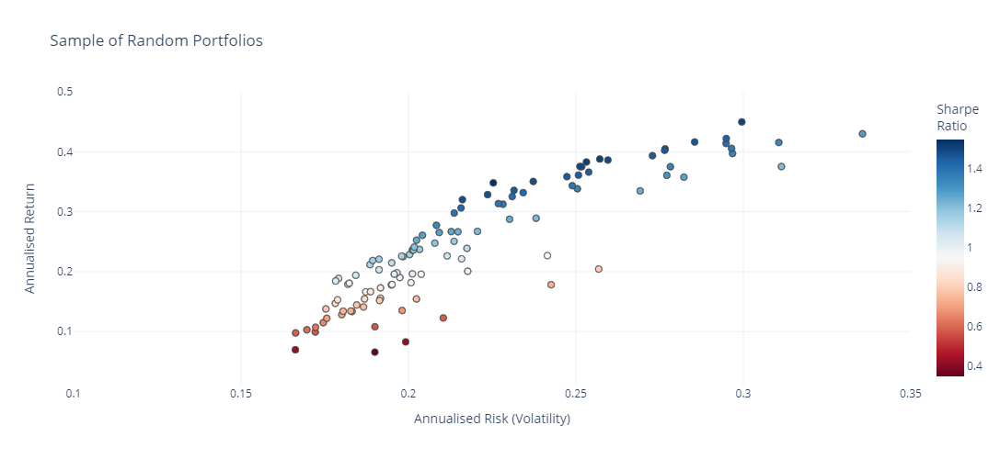

In [85]:
mean_variance_pairs = np.array(mean_variance_pairs)

risk_free_rate=0 #-- Include risk free rate here

fig = go.Figure()
fig.add_trace(go.Scatter(x=mean_variance_pairs[:,1]**0.5, y=mean_variance_pairs[:,0], 
                      marker=dict(color=(mean_variance_pairs[:,0]-risk_free_rate)/(mean_variance_pairs[:,1]**0.5), 
                                  showscale=True, 
                                  size=7,
                                  line=dict(width=1),
                                  colorscale="RdBu",
                                  colorbar=dict(title="Sharpe<br>Ratio")
                                 ), 
                      mode='markers'))
fig.update_layout(template='plotly_white',
                  xaxis=dict(title='Annualised Risk (Volatility)'),
                  yaxis=dict(title='Annualised Return'),
                  title='Sample of Random Portfolios',
                  width=850,
                  height=500)
fig.update_xaxes(range=[0.1, 0.35])
fig.update_yaxes(range=[0.01,0.5])
fig.update_layout(coloraxis_colorbar=dict(title="Sharpe Ratio"))

In [75]:
#-- Create random portfolio weights and indexes
#- How many assests in the portfolio
n_assets = 5

mean_variance_pairs = []
weights_list=[]
tickers_list=[]

for i in tqdm(range(10000)):
    next_i = False
    while True:
        #- Choose assets randomly without replacement
        assets = np.random.choice(list(returns.columns), n_assets, replace=False)
        #- Choose weights randomly ensuring they sum to one
        weights = np.random.rand(n_assets)
        weights = weights/sum(weights)

        #-- Loop over asset pairs and compute portfolio return and variance
        portfolio_E_Variance = 0
        portfolio_E_Return = 0
        for i in range(len(assets)):
            portfolio_E_Return += weights[i] * mus.loc[assets[i]]
            for j in range(len(assets)):
                portfolio_E_Variance += weights[i] * weights[j] * cov.loc[assets[i], assets[j]]

        #-- Skip over dominated portfolios
        for R,V in mean_variance_pairs:
            if (R > portfolio_E_Return) & (V < portfolio_E_Variance):
                next_i = True
                break
        if next_i:
            break

        #-- Add the mean/variance pairs to a list for plotting
        mean_variance_pairs.append([portfolio_E_Return, portfolio_E_Variance])
        weights_list.append(weights)
        tickers_list.append(assets)
        break

100%|██████████| 10000/10000 [00:19<00:00, 508.44it/s]


In [76]:
len(mean_variance_pairs)

108

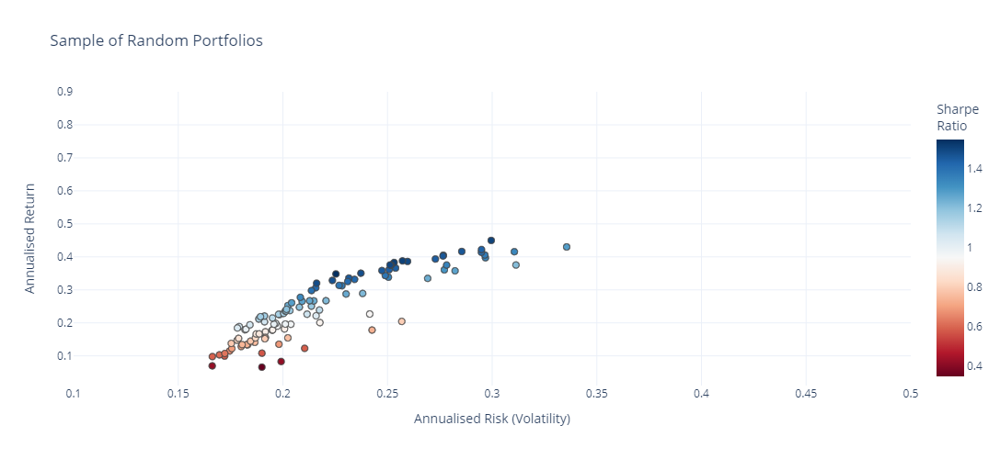

In [81]:
#-- Plot the risk vs. return of randomly generated portfolios
#-- Convert the list from before into an array for easy plotting
mean_variance_pairs = np.array(mean_variance_pairs)

risk_free_rate=0 #-- Include risk free rate here

fig = go.Figure()
fig.add_trace(go.Scatter(x=mean_variance_pairs[:,1]**0.5, y=mean_variance_pairs[:,0], 
                      marker=dict(color=(mean_variance_pairs[:,0]-risk_free_rate)/(mean_variance_pairs[:,1]**0.5), 
                                  showscale=True, 
                                  size=7,
                                  line=dict(width=1),
                                  colorscale="RdBu",
                                  colorbar=dict(title="Sharpe<br>Ratio")
                                 ), 
                      mode='markers',
                      text=[str(np.array(tickers_list[i])) + "<br>" + str(np.array(weights_list[i]).round(2)) for i in range(len(tickers_list))]))
fig.update_layout(template='plotly_white',
                  xaxis=dict(title='Annualised Risk (Volatility)'),
                  yaxis=dict(title='Annualised Return'),
                  title='Sample of Random Portfolios',
                  width=850,
                  height=500)
fig.update_xaxes(range=[0.1, 0.5])
fig.update_yaxes(range=[0.01,0.9])
fig.update_layout(coloraxis_colorbar=dict(title="Sharpe Ratio"))